In [1]:
from visual_genome.local import VisualGenome
import json

### Loading the data

The data is loaded from the `json` files located in the `data/` directory. It may take a few minutes to load the data. Please make sure to run `setup.py` first to get all necessary `json` files.

In [2]:
vg = VisualGenome() # this may take 2-3 minutes

Loading data...
Data loaded.


In [3]:
object_id = 168597
obj = vg.get_object(object_id)
obj.image_id

2413676

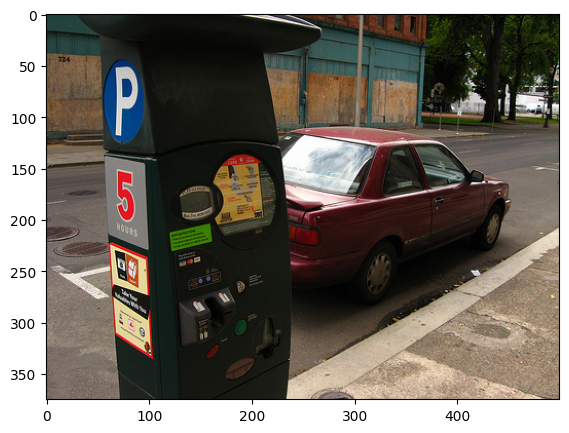

In [4]:
vg.visualize_objects(2415883)

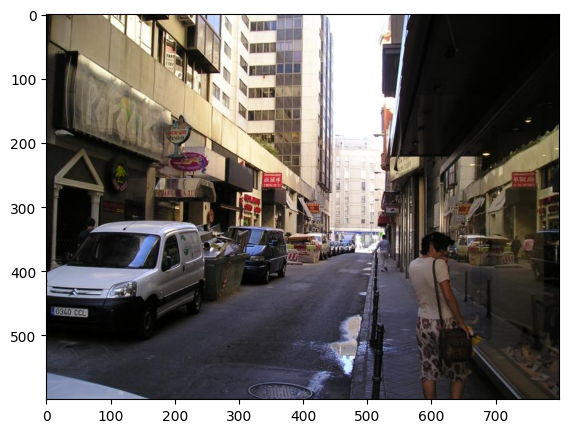

In [5]:
vg.visualize_objects(355, 8)

### Image Retrieval and Visualization

We can sample an `Image` object from the data and visualize it, or we can directly visualize a random image.


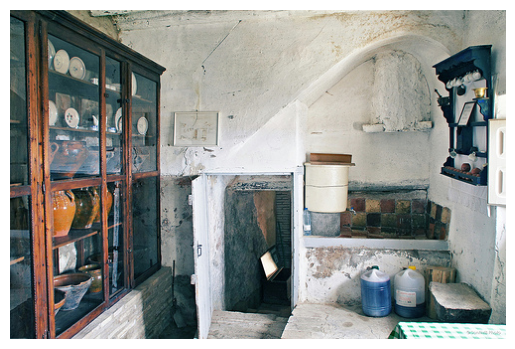

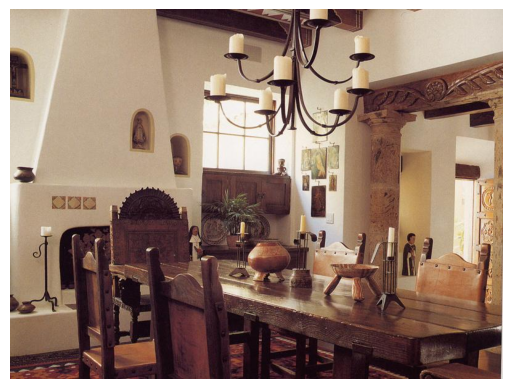

In [6]:
img = vg.sample_images() # sample single image - returns an IMAGE object (you can also sample a list of images by passing a number as an argument)
vg.display_image(img)

## or directly visualize a random image
vg.display_random_image()

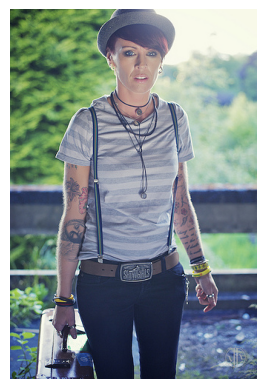

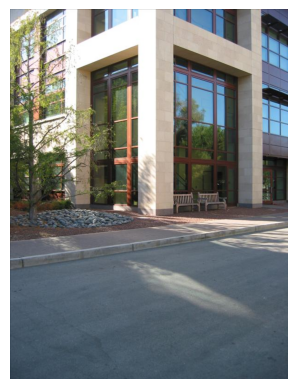

In [7]:
# You can sample an image ID as well
id = vg.sample_image_id()
vg.display_image(id)

# If you want, you can sample from a specific interval
id = vg.sample_image_id(start = 0, end = 1000)
vg.display_image(id)

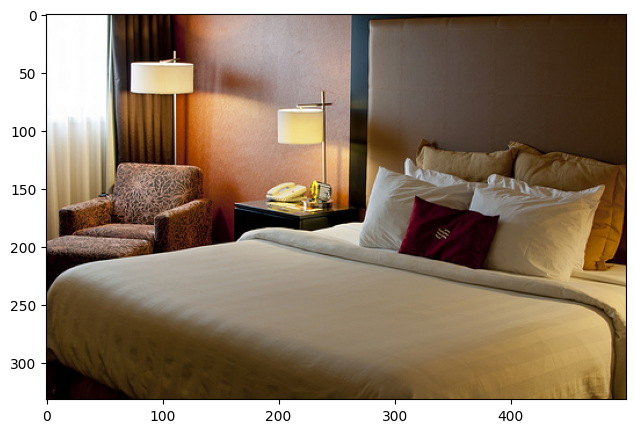

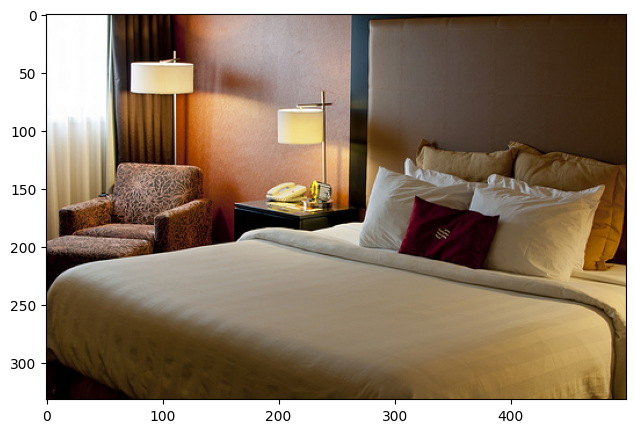

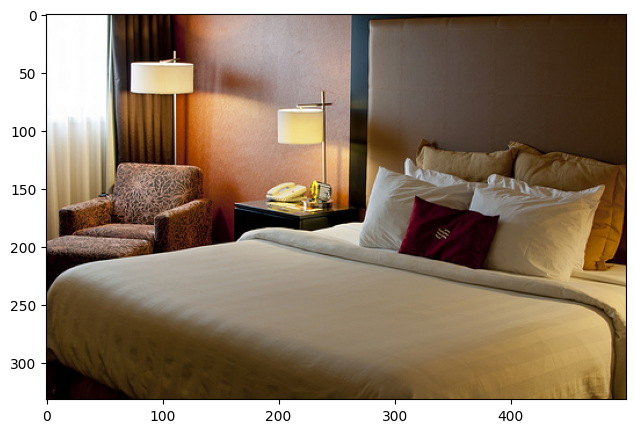

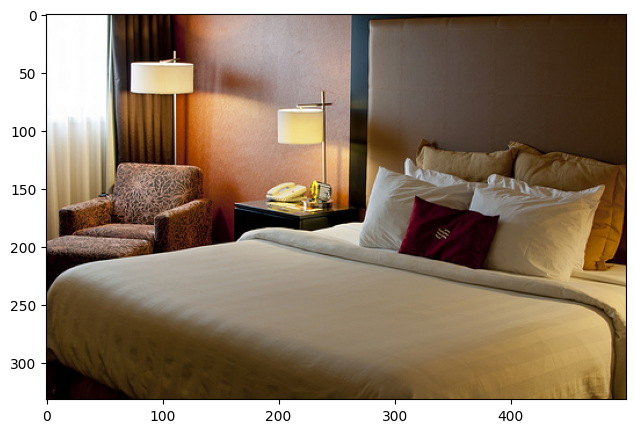

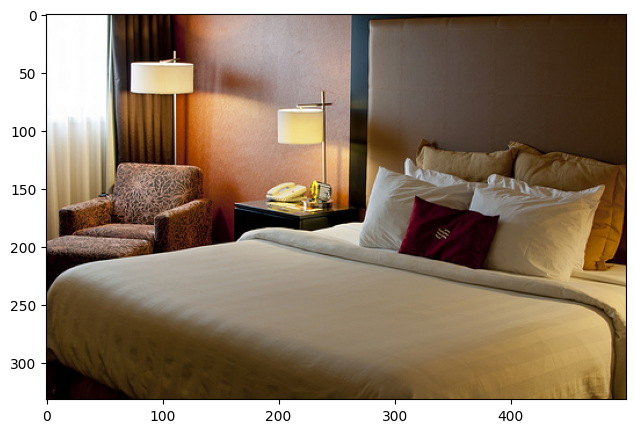

In [8]:
id = vg.sample_image_id()

# you can visualize the objects in an image, second parameter specifies the number of regions to visualize (avoid using large numbers for visibility)
vg.visualize_objects(id, 5)
# visualize without any description
vg.visualize_objects(id, 5, desc=False)
# visualize without objects
vg.visualize_objects(id, 0) # same as display_image(2408156)
# visualize without synsets
vg.visualize_objects(id, 5, synsets=False)
# visualize without attributes
vg.visualize_objects(id, 5, attributes=False)

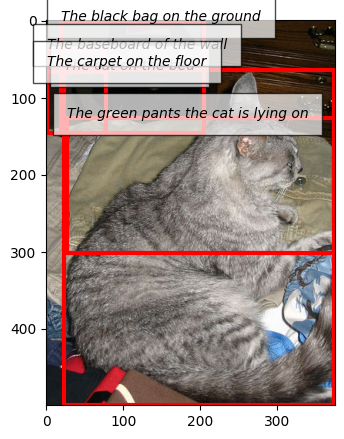

In [9]:
id = vg.sample_image_id()

# You can visualize regions as well, second parameter specifies the number of regions to visualize (avoid using large numbers for visibility)
vg.visualize_regions(id, 5)

### Scene Graph Generation

To visualize a scene graph, first we should call `generate_scene_graph_json` with the id of the image we want to visualize. It returns a `json` object that contains the scene graph of the image. Then we store the `json` object in the `graphviz` folder and call `graphviz/visualize_scene_graph.py` to render the scene graph.

In [10]:
id = vg.sample_image_id()
scene_graph = vg.generate_scene_graph_json(1)

import json
# save to graph.json
with open(f"graphviz/scene_graph.json", "w") as f:
    json.dump(scene_graph, f)

Now, generated scene graph is stored as a `json` file in the `graphviz` directory. You can visualize the scene graph by running the following code.

```bash
python graphviz/visualize_scene_graph.py
```


### Cluster Visualization

After running `clustering.ipynb`, two `csv` files are generated:

1. **First CSV**: Contains the following fields:
   - `Image_id`: The ID of the image.
   - `cluster`: The assigned cluster for the image.
   - `region_sentences`: Descriptive sentences for the image's regions.
   - `embeddings`: Feature embeddings for the image.
   - `centroid`: The cluster's centroid coordinates.
   - `distance_from_centroid`: The distance of the image's embedding from its assigned cluster centroid.

2. **Second CSV**: Includes only the `Image_id` and the corresponding `cluster`.

Using the second CSV file, you can visualize sample images from a specific cluster side by side.
 

In [11]:
csv_file = "categories_all-mpnet-base-v2_30clusters_simple.csv" # this is an example file, please change it according to yours
import pandas as pd
import random

df = pd.read_csv(csv_file)
df.head()

,Image_id,cluster
0,2392778,24
1,2350124,7
2,2331619,21
3,1568,25
4,2351423,27


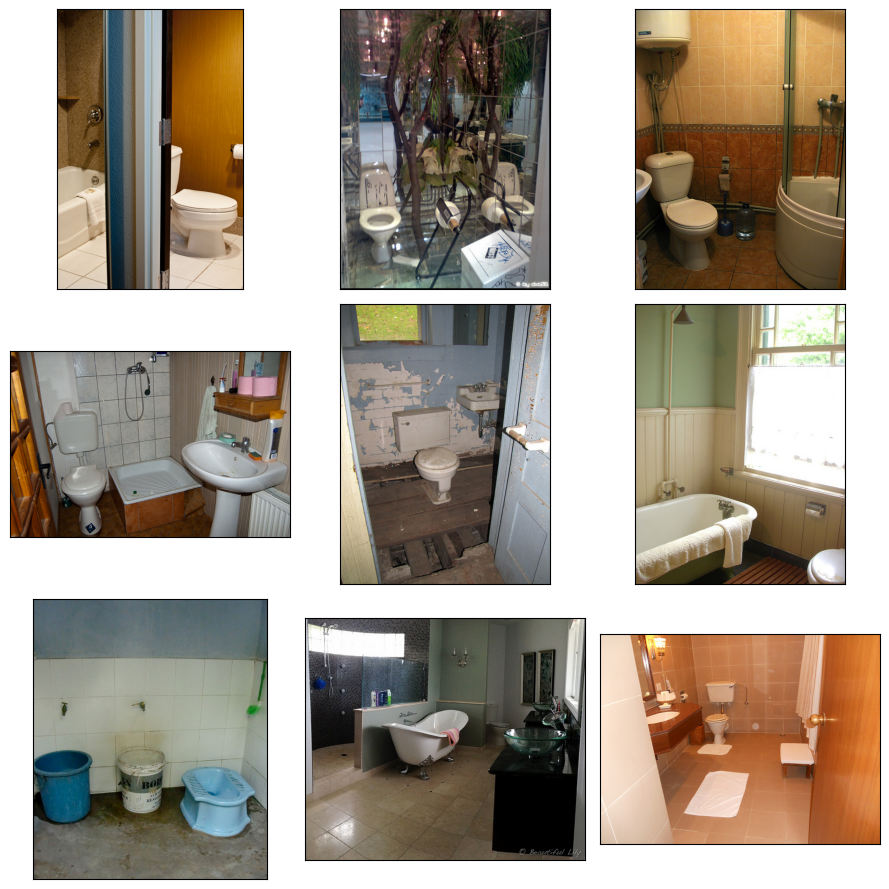

In [12]:
vg.visualize_cluster(df = df, cluster = 0, n = 3) # visualizes n x n grid of images from the given cluster

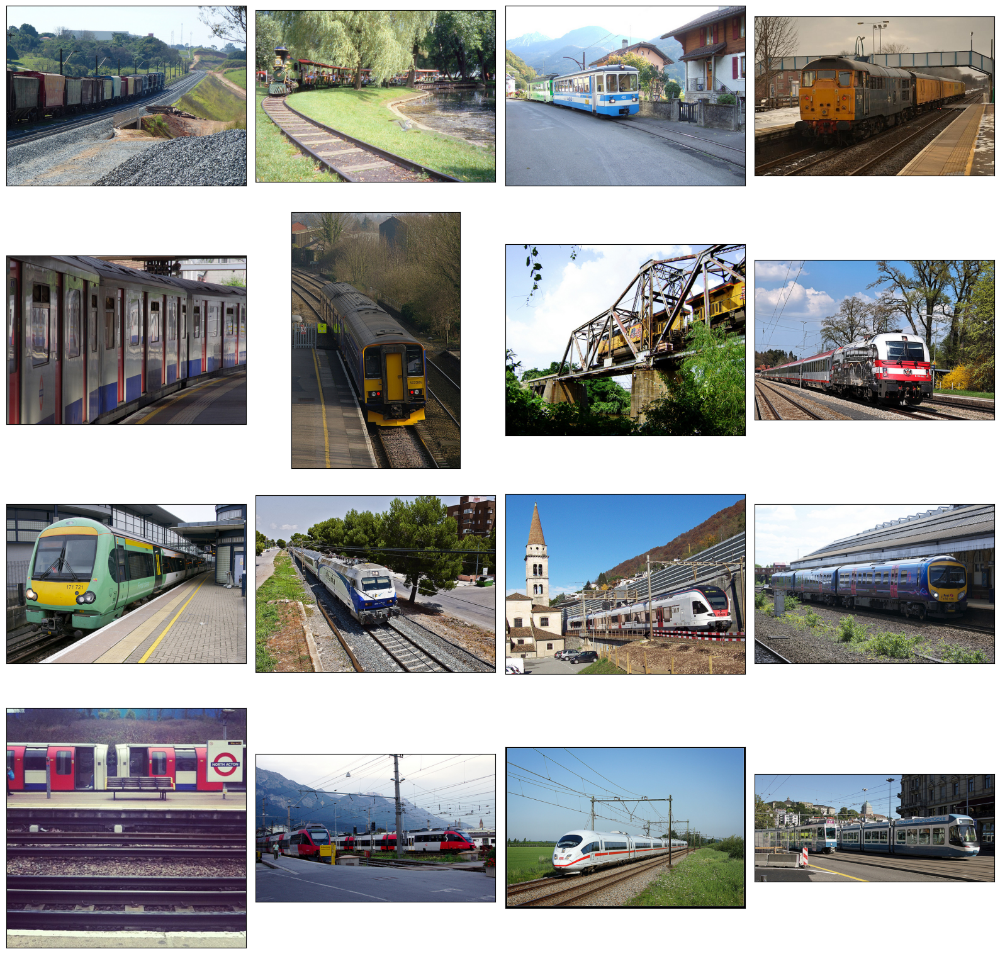

In [13]:
vg.visualize_cluster(df = df, cluster = 7, n = 4)

### Case
* Select a random cluster.
* Randomly sample an image from the cluster.
* Visualize the image.
* Print the statistics of the image.
* Generate the scene graph of the image.
* Generate a histogram of number of objects for that cluster.

Cluster:  29


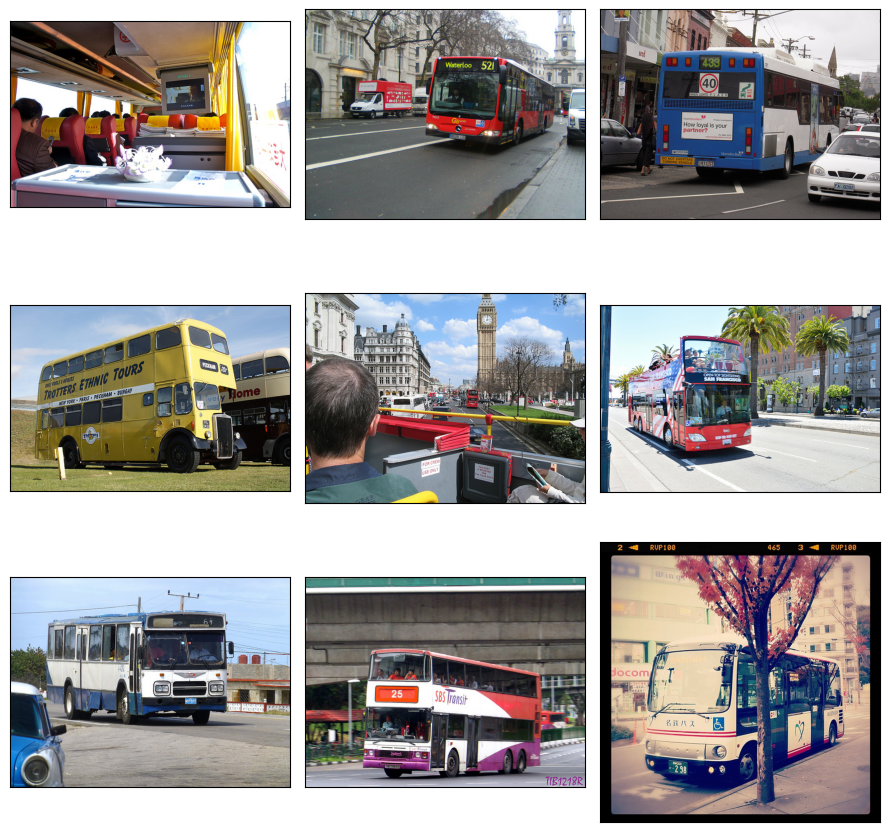

Image ID:  2376906


In [14]:
# get cluster field of df
clusters = df["cluster"].unique()

# sample a cluster
cluster = random.choice(clusters)
print("Cluster: ", cluster)

# visualize the cluster
vg.visualize_cluster(df = df, cluster = cluster, n = 3)

# get images from that clsuter
images = df[df["cluster"] == cluster]["Image_id"].values

# sample an image
image = random.choice(images)
print("Image ID: ", image)

In [15]:
# RUN THIS BLOCK IF YOU HAVE SAM, SAM2 RESULTS IN THE DATA DIRECTORY
vg.load_sam_results(version=1) # SAM
vg.load_sam_results(version=2) # SAM 2

{'2388070': 4,
 '2356396': 10,
 '2343737': 7,
 '1734': 10,
 '2322280': 8,
 '1591961': 3,
 '2408345': 5,
 '2342701': 6,
 '2322581': 4,
 '2387375': 9,
 '2326714': 3,
 '2338558': 2,
 '2326525': 0,
 '2536': 1,
 '2318468': 5,
 '2415883': 10,
 '2332666': 8,
 '2347726': 7,
 '2338305': 1,
 '2366309': 5,
 '2336164': 6,
 '2372427': 1,
 '2386431': 4,
 '1592880': 2,
 '2316112': 8,
 '2362879': 2,
 '2352548': 9,
 '2397635': 7,
 '2417079': 10,
 '2369519': 2,
 '2324016': 5,
 '2370861': 4,
 '2415631': 10,
 '2337739': 10,
 '3037': 9,
 '2408046': 5,
 '2359450': 10,
 '2358408': 5,
 '2387208': 1,
 '2382062': 1,
 '2320087': 3,
 '2389391': 6,
 '2415882': 3,
 '379': 12,
 '1159430': 21,
 '2325777': 9,
 '2324204': 5,
 '2414144': 8,
 '2397765': 5,
 '2334055': 2,
 '1038': 7,
 '2321998': 7,
 '2347980': 2,
 '2322595': 4,
 '2349064': 4,
 '2338914': 5,
 '2388074': 12,
 '2359110': 6,
 '2402334': 9,
 '2403021': 8,
 '2406624': 2,
 '2336834': 1,
 '3650': 3,
 '2385217': 4,
 '2406328': 7,
 '2347356': 3,
 '713797': 26,
 '23

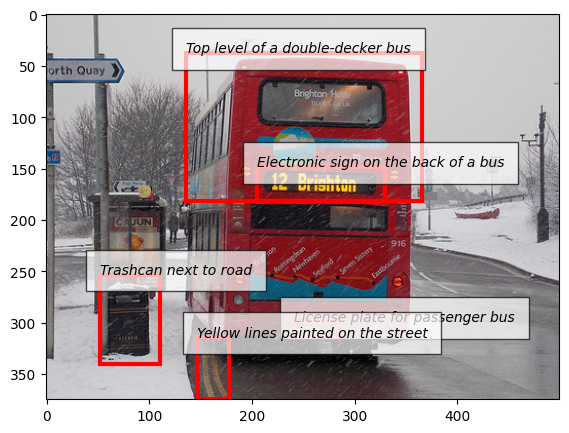

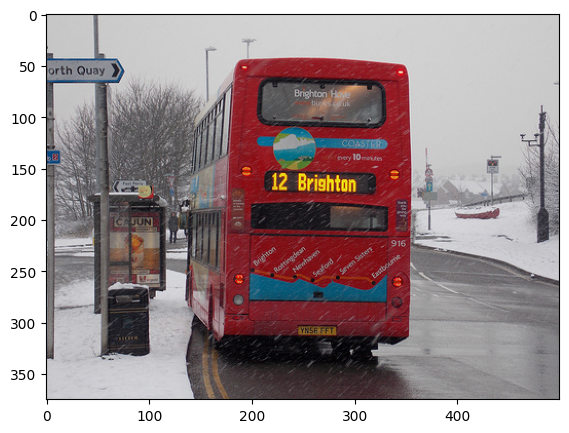

In [16]:
# visualize the image with region descriptions
vg.visualize_regions(image, 5)

# visualize the image with objects
vg.visualize_objects(image, 5)

In [17]:
stats = vg.get_image_statistics(image)
print("Statistics for Image:\n",)

import json
print(json.dumps(stats, indent=4))

Statistics for Image:

{
    "# of objects": 29,
    "# of attributes": 10,
    "# of relationships": 18,
    "vertices to node ratio": "0.81",
    "# of unique objects": 24,
    "# of unique attributes": 5,
    "# of unique relationships": 4,
    "# of objects with missing synsets": 2,
    "# of attributes with missing synsets": 2,
    "# of relationships with missing synsets": 0,
    "Average attribute inverse frequency": "0.035177",
    "Average object inverse frequency": "3.949201",
    "Average relationship inverse frequency": "0.000951",
    "# of SAM segmentations": "Not available",
    "# of SAM 2 segmentations": "Not available",
    "# of FC-CLIP classes": "Not available",
    "SAM - Number of segmentations": 165,
    "SAM2 - Number of segmentations": 8
}


In [18]:
scene_graph = vg.generate_scene_graph_json(image)

# save to graph.json
with open(f"graphviz/scene_graph.json", "w") as f:
    json.dump(scene_graph, f)

# run the following command to visualize the scene graph
# python graphviz/visualize_scene_graph.py

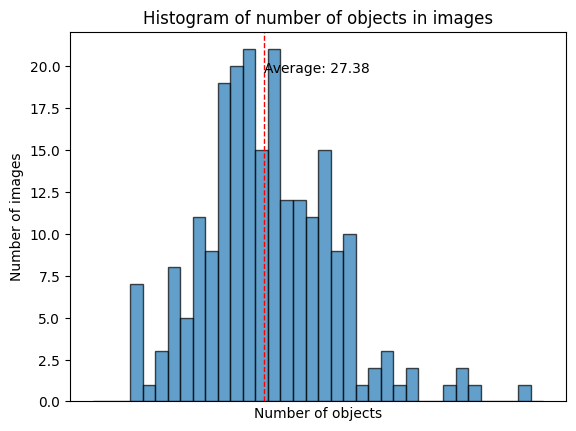

In [19]:
vg.histogram("objects", images)

### SAM, SAM 2 and FC-CLIP Statistics

In [20]:
vg.load_sam_results()

{'2388070': 40,
 '2356396': 423,
 '2343737': 212,
 '1734': 137,
 '2322280': 62,
 '1591961': 109,
 '2408345': 69,
 '2342701': 64,
 '2322581': 56,
 '2387375': 157,
 '2326714': 120,
 '2338558': 153,
 '2326525': 45,
 '2536': 139,
 '2318468': 273,
 '2415883': 163,
 '2332666': 194,
 '2347726': 187,
 '2338305': 50,
 '2366309': 115,
 '2336164': 136,
 '2372427': 276,
 '2386431': 82,
 '1592880': 72,
 '2316112': 66,
 '2362879': 43,
 '2352548': 130,
 '2397635': 102,
 '2417079': 109,
 '2369519': 83,
 '2324016': 257,
 '2370861': 118,
 '2415631': 308,
 '2337739': 147,
 '3037': 249,
 '2408046': 104,
 '2359450': 176,
 '2358408': 62,
 '2387208': 74,
 '2382062': 49,
 '2320087': 120,
 '2389391': 45,
 '2415882': 57,
 '379': 176,
 '1159430': 186,
 '2325777': 190,
 '2324204': 128,
 '2414144': 63,
 '2397765': 99,
 '2334055': 142,
 '1038': 117,
 '2321998': 76,
 '2347980': 136,
 '2322595': 65,
 '2349064': 63,
 '2338914': 80,
 '2388074': 160,
 '2359110': 138,
 '2402334': 163,
 '2403021': 99,
 '2406624': 139,
 '2

{
    "# of objects": 7,
    "# of attributes": 3,
    "# of relationships": 2,
    "vertices to node ratio": "0.58",
    "# of unique objects": 7,
    "# of unique attributes": 3,
    "# of unique relationships": 1,
    "# of objects with missing synsets": 0,
    "# of attributes with missing synsets": 0,
    "# of relationships with missing synsets": 0,
    "Average attribute inverse frequency": "0.008310",
    "Average object inverse frequency": "1.047232",
    "Average relationship inverse frequency": "0.000000",
    "# of SAM segmentations": "Not available",
    "# of SAM 2 segmentations": "Not available",
    "# of FC-CLIP classes": "Not available",
    "SAM - Number of segmentations": 270,
    "SAM2 - Number of segmentations": 13
}


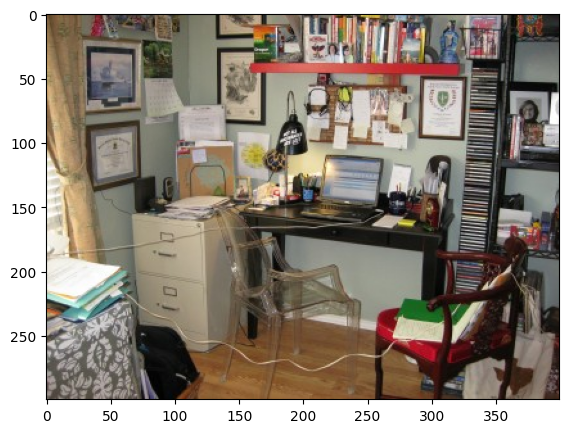

In [21]:
# randomly sample image
id = vg.sample_image_id()

js = vg.get_image_statistics(id)
print(json.dumps(js, indent=4))

vg.visualize_objects(id, 5)

### SAM Visualization

To visualize SAM segmentations, place the segmentation masks (PNG files) and `metadata.csv` in a subfolder named after the image ID inside the `/data` directory.

```kotlin
data/
    2315963/
        0.png
        1.png
        2.png
        3.png
        4.png
        metadata.csv
    ...
```

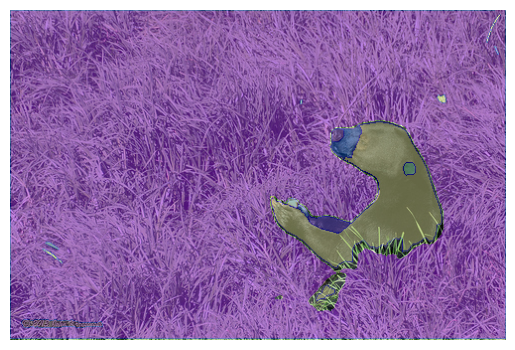

In [22]:
id = 2315963

vg.visualize_segmentations(id)